In [1]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


Kaggle credentials set.
Kaggle credentials successfully validated.


In [2]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

danielericcobene_imagenet5_path = kagglehub.dataset_download('danielericcobene/imagenet5')
danielericcobene_imagenet_5_path = kagglehub.dataset_download('danielericcobene/imagenet-5')

print('Data source import complete.')


100%|██████████| 590M/590M [00:31<00:00, 19.8MB/s]

Extracting files...


100%|██████████| 345M/345M [00:19<00:00, 18.9MB/s]

Extracting files...


Data source import complete.


In [ ]:
print(danielericcobene_imagenet_5_path)

/root/.cache/kagglehub/datasets/danielericcobene/imagenet-5/versions/1


In [8]:
import os
import torch
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset, random_split
import torchvision.transforms as transforms

# Percorso dataset
dataset_path = '/root/.cache/kagglehub/datasets/danielericcobene/imagenet-5/versions/1/imagenet-5/imagenet-5'

# Trasformazioni
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Carica tutto il dataset (tutte le immagini, tutte le classi)
full_dataset = ImageFolder(root=dataset_path, transform=transform)

# Definisci percentuale train/val
train_ratio = 0.8
train_size = int(train_ratio * len(full_dataset))
val_size = len(full_dataset) - train_size

# Split random (con seed per riproducibilità)
torch.manual_seed(42)
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])

# DataLoader
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

print(f"Train dimensions: {len(train_dataset)}")
print(f"Validation dimensions: {len(val_dataset)}")
print(f"Classi: {full_dataset.classes}")

Train dimensions: 3120
Validation dimensions: 780
Classi: ['n02056570', 'n02085936', 'n02690373']


In [10]:
import torch.nn as nn
import torchvision.models as models


def create_model(num_classes=3):
    model = models.resnet18(pretrained=False)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_m1 = create_model(num_classes=3).to(device)

print(model_m1)

# Ottimizzatore e loss
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_m1.parameters(), lr=1e-3)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [8]:
def train(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    avg_loss = total_loss / len(dataloader)
    return avg_loss

def evaluate(model, dataloader, device):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return correct / total

for epoch in range(5):
    train_loss = train(model_m1, train_loader, optimizer, criterion, device)
    val_accuracy = evaluate(model_m1, val_loader, device)
    print(f"Epoch {epoch+1} - Train Loss: {train_loss:.4f} - Val Accuracy: {val_accuracy*100:.2f}%")

Epoch 1 - Train Loss: 0.5640 - Val Accuracy: 55.38%
Epoch 2 - Train Loss: 0.4361 - Val Accuracy: 75.64%
Epoch 3 - Train Loss: 0.3611 - Val Accuracy: 52.95%
Epoch 4 - Train Loss: 0.3194 - Val Accuracy: 49.49%
Epoch 5 - Train Loss: 0.2642 - Val Accuracy: 85.90%


In [1]:
!pip install torchcam

In [13]:
model_resnet50 = models.resnet50(pretrained=True)
model_resnet50 = model_resnet50.to(device)
model_resnet50.eval()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [14]:
from torchcam.methods import GradCAM

cam_m1 = GradCAM(model_m1, target_layer="layer4")
cam_resnet50 = GradCAM(model_resnet50, target_layer="layer4")

In [15]:
def generate_cam_batch(model, cam_extractor, images, device, target_labels=None, use_pred=True):
    model.eval()
    cams = []

    for i in range(images.size(0)):
        image = images[i].unsqueeze(0).to(device)
        output = model(image)

        if use_pred:
            target_class = output.argmax(dim=1).item()
        else:
            if target_labels is None:
                raise ValueError("target_labels must be provided if use_pred=False")
            target_class = target_labels[i].item()

        activation_map = cam_extractor(target_class, output)
        cams.append(activation_map[0].cpu().detach())

    return cams


In [4]:
!pip install mamba-ssm --no-build-isolation # installa mamba

  Using cached mamba_ssm-2.2.4.tar.gz (91 kB)
  Preparing metadata (pyproject.toml) ... done
  Using cached ninja-1.11.1.4-py3-none-manylinux_2_12_x86_64.manylinux2010_x86_64.whl.metadata (5.0 kB)
Using cached ninja-1.11.1.4-py3-none-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (422 kB)
  Created wheel for mamba-ssm: filename=mamba_ssm-2.2.4-cp311-cp311-linux_x86_64.whl size=323672993 sha256=8a0be01153fa30727a9e69024fbe061eb92c7ba4416d2049c5fc3107ed91d852
  Stored in directory: /root/.cache/pip/wheels/2a/5e/64/cfcb5dfe4f854944456e031c34953dc872af1ad7c206145d4a
Successfully built mamba-ssm


In [28]:
pip install git+https://github.com/Arhosseini77/SUM.git # in caso il primo non funziona

  Cloning https://github.com/Arhosseini77/SUM.git to /tmp/pip-req-build-gm8cobik
  Running command git clone --filter=blob:none --quiet https://github.com/Arhosseini77/SUM.git /tmp/pip-req-build-gm8cobik
  Resolved https://github.com/Arhosseini77/SUM.git to commit 2671626fb0efce351debb1352c55f5f1b9f08196
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached causal_conv1d-1.5.0.post8-cp311-cp311-linux_x86_64.whl
  Using cached mamba_ssm-2.2.4.tar.gz (91 kB)
  Installing build dependencies ... canceled
ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
           ^^

KeyboardInterrupt: 

In [22]:
!pip install gdown # installa gdown per installare il modello dalla cartella drive

In [23]:
!gdown 14ma_hLe8DrVNuHCSKoOz41Q-rB1Hbg6A -O net/pre_trained_weights/sum_model.pth #copia il modello da drive e lo mette nella cartella net/pre

Downloading...
From (original): https://drive.google.com/uc?id=14ma_hLe8DrVNuHCSKoOz41Q-rB1Hbg6A
From (redirected): https://drive.google.com/uc?id=14ma_hLe8DrVNuHCSKoOz41Q-rB1Hbg6A&confirm=t&uuid=3509b3c9-b6ee-4997-841f-d1fe46ff40df
To: /content/SUM/net/pre_trained_weights/sum_model.pth
100% 230M/230M [00:08<00:00, 26.6MB/s]


In [5]:
%cd SUM
!python inference_dataset.py \
    --dataset_path /root/.cache/kagglehub/datasets/danielericcobene/imagenet-5/versions/1/imagenet-5/imagenet-5 \
    --output_path /content/saliency_maps \
    --heat_map_type Overlay

/content/SUM
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
Processing n02690373: 100% 1300/1300 [04:39<00:00,  4.65it/s]
Processing n02056570: 100% 1300/1300 [05:10<00:00,  4.18it/s]
Processing n02085936: 100% 1300/1300 [04:36<00:00,  4.71it/s]


In [19]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import numpy as np

def show_gradcam_saliency(img_tensor, cam1, cam2, sal1, sal2, class_name=""):
    # img_tensor: [3, H, W]
    img = TF.to_pil_image(img_tensor.cpu())
    img_np = np.array(img)

    cam1_np = cam1.detach().cpu().numpy()
    cam2_np = cam2.detach().cpu().numpy()
    #sal1_np = sal1.detach().cpu().numpy()
    #sal2_np = sal2.detach().cpu().numpy()
    sal1_np = np.array(sal1)
    sal2_np = np.array(sal2)

    fig, axs = plt.subplots(2, 3, figsize=(12, 8))
    fig.suptitle(f'Class: {class_name}', fontsize=16)

    # RIGA 1: MODELLO M1
    axs[0, 0].imshow(img_np)
    axs[0, 0].set_title('Original Image')
    axs[0, 1].imshow(img_np)
    axs[0, 1].imshow(cam1_np, cmap='jet', alpha=0.5)
    axs[0, 1].set_title('GradCAM - M1')
    axs[0, 2].imshow(sal1_np)
    axs[0, 2].set_title('Saliency Map')

    # RIGA 2: MODELLO RESNET50
    axs[1, 0].imshow(img_np)
    axs[1, 0].set_title('Original Image')
    axs[1, 1].imshow(img_np)
    axs[1, 1].imshow(cam2_np, cmap='jet', alpha=0.5)
    axs[1, 1].set_title('GradCAM - R50')
    axs[1, 2].imshow(sal2_np)
    axs[1, 2].set_title('Saliency Map')

    for ax in axs.flat:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

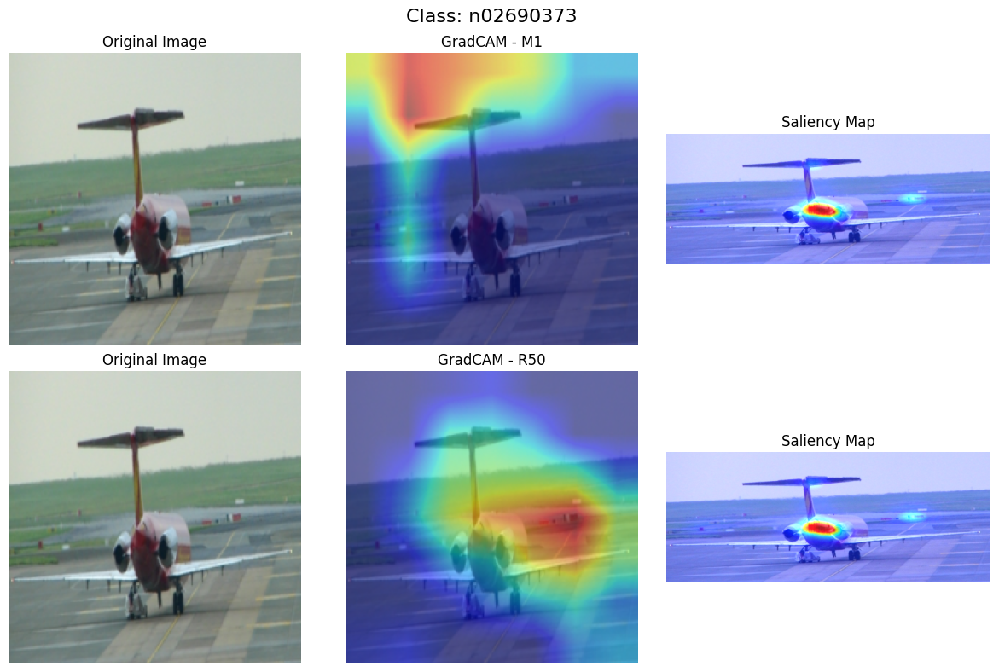

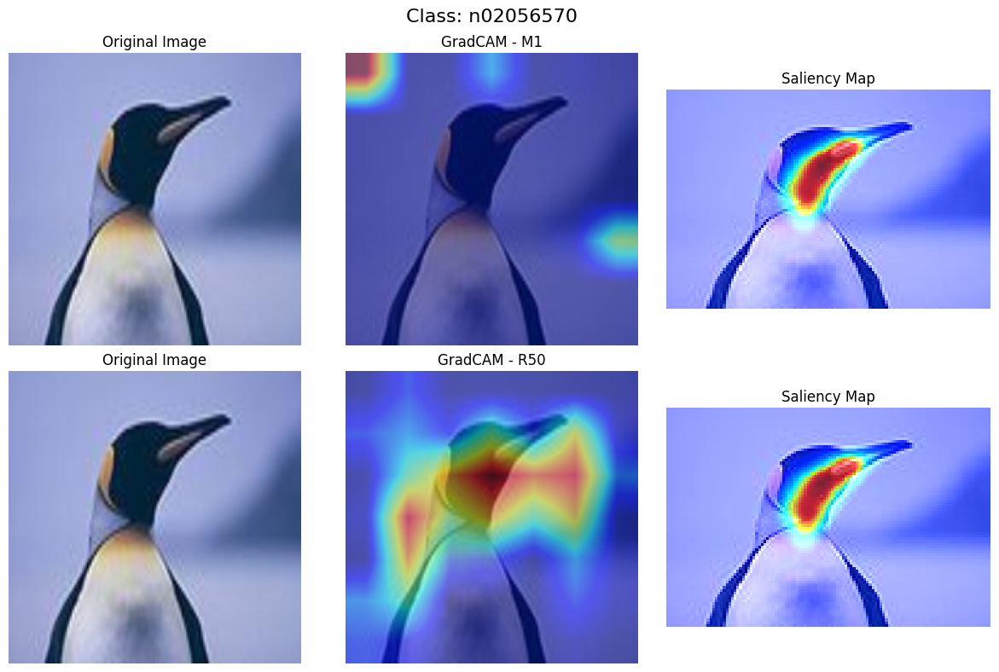

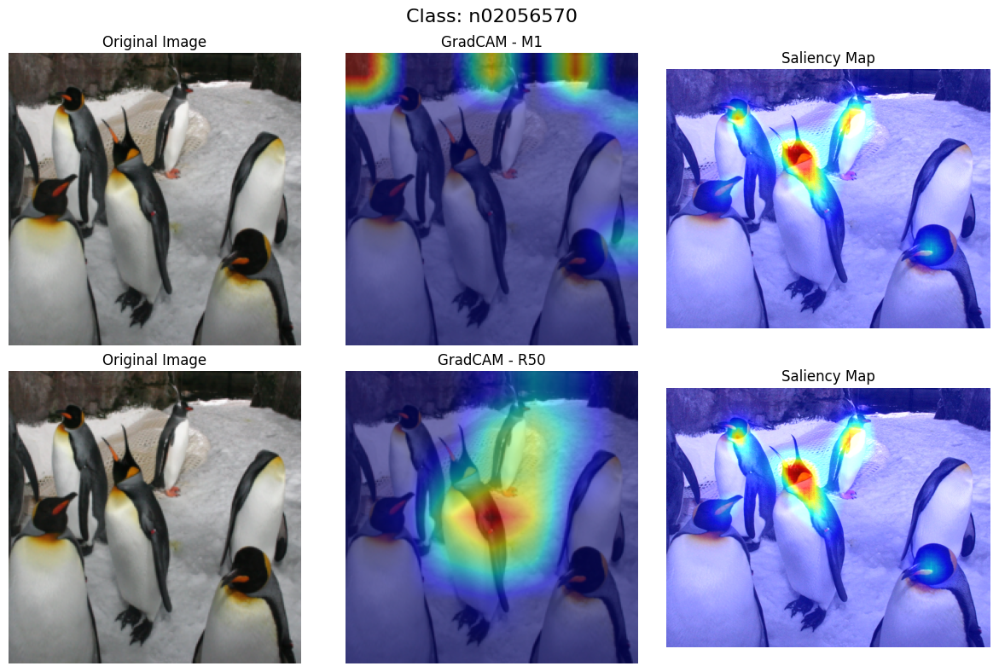

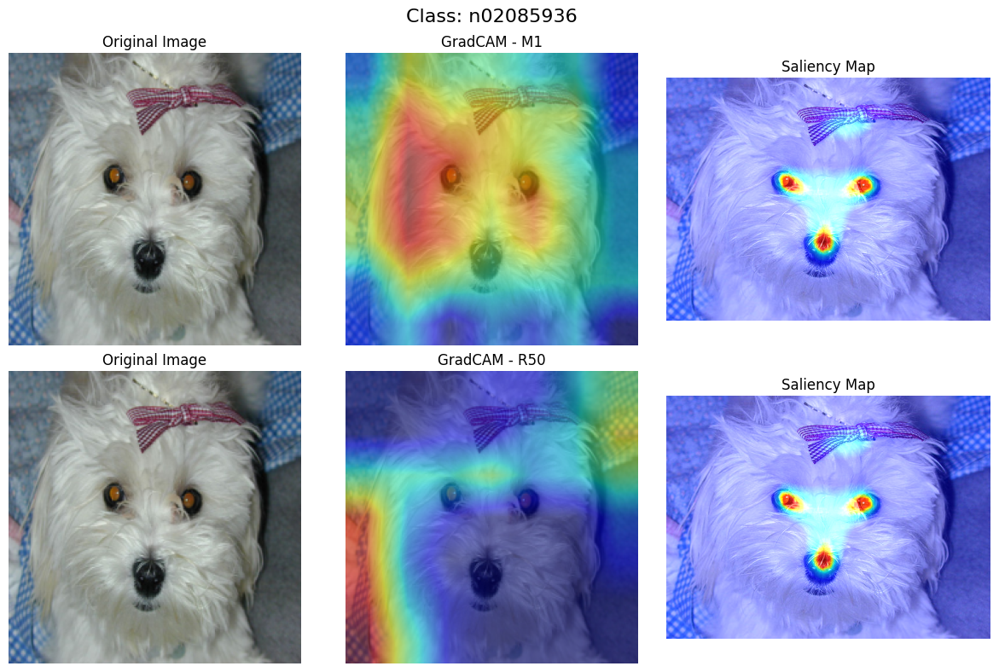

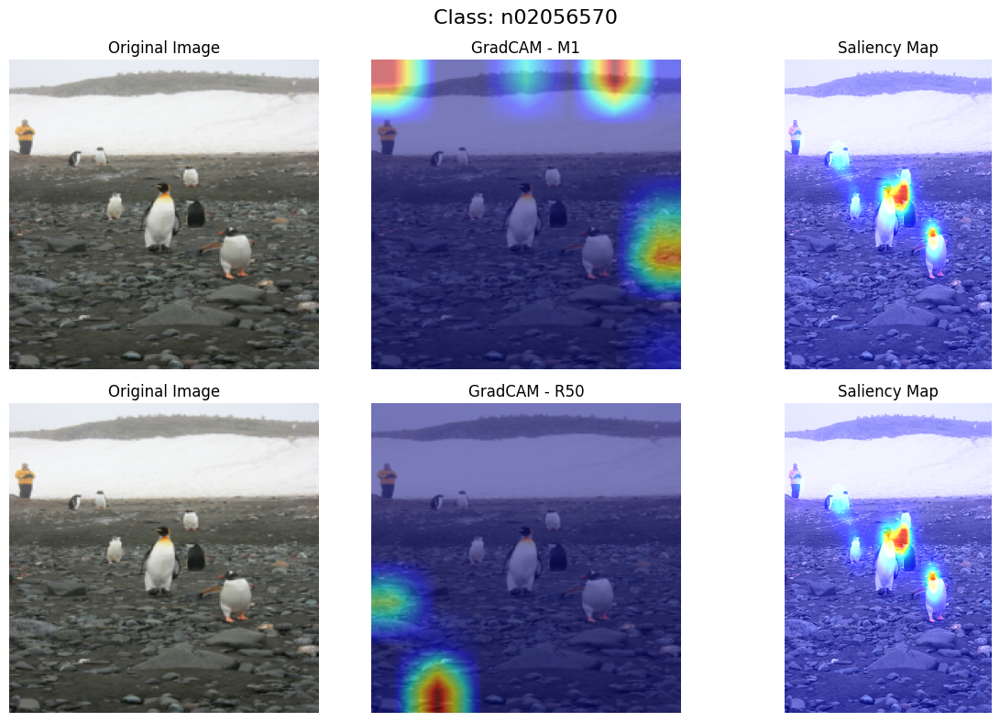

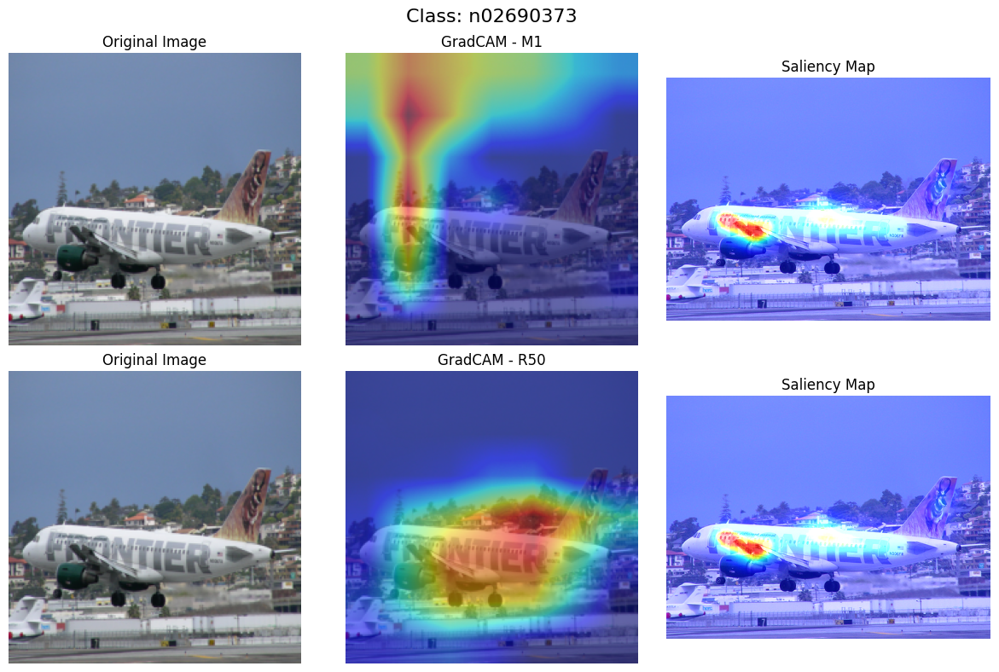

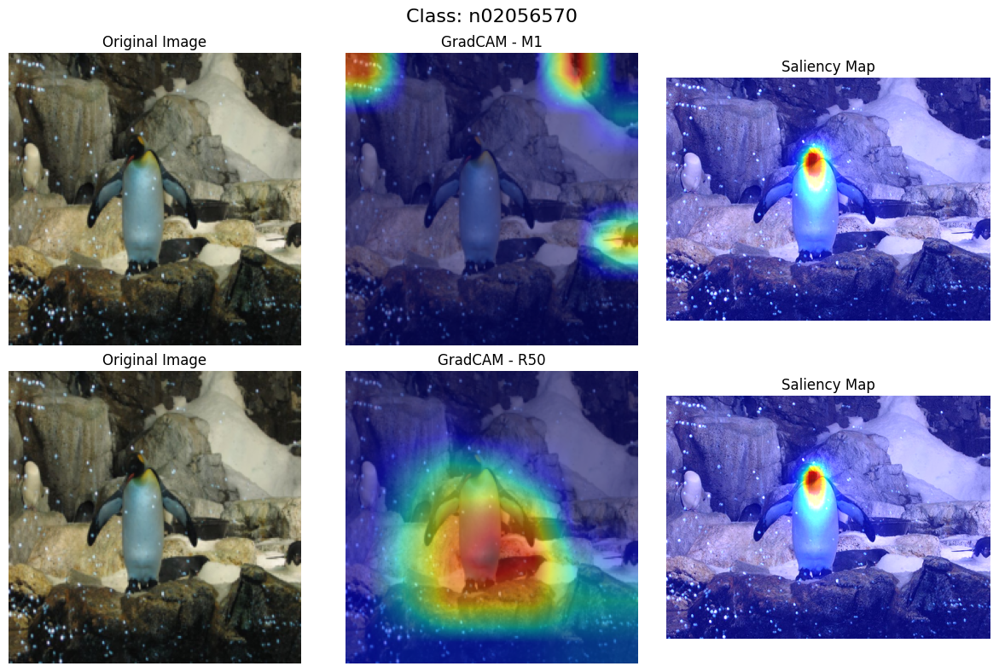

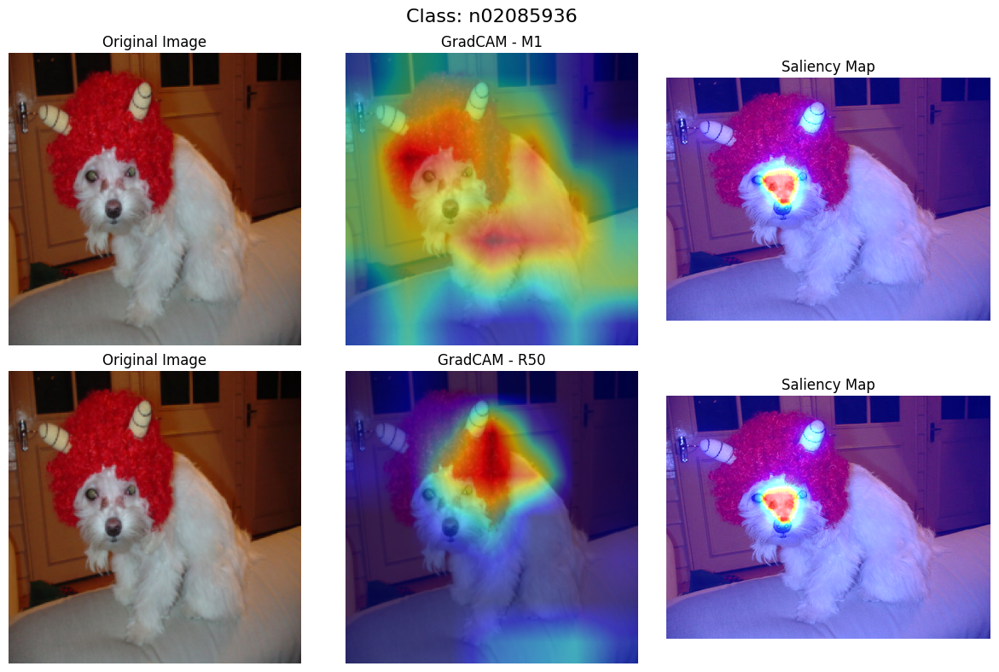

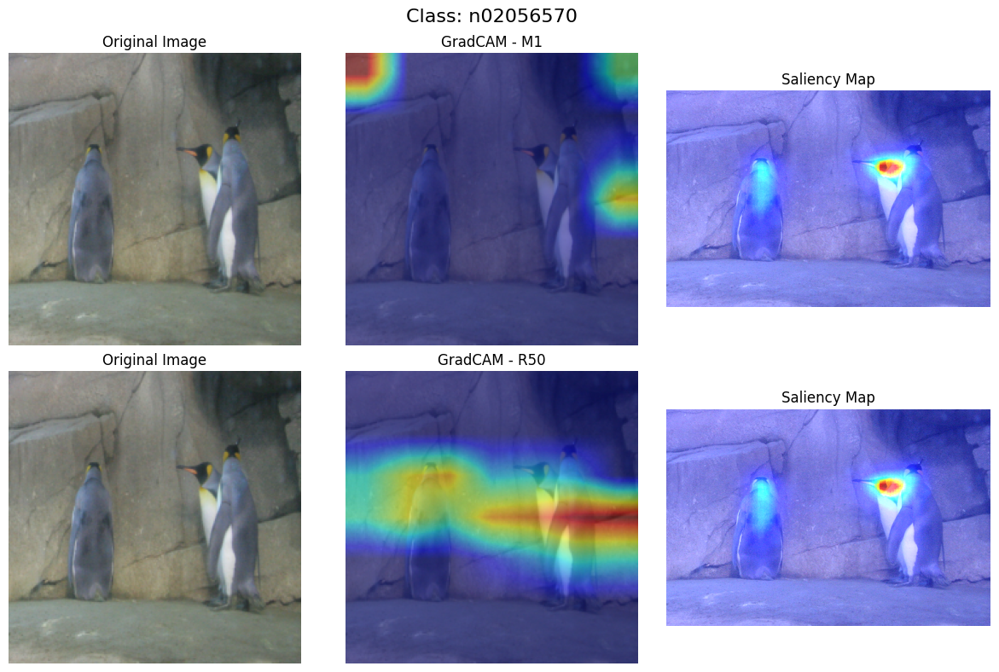

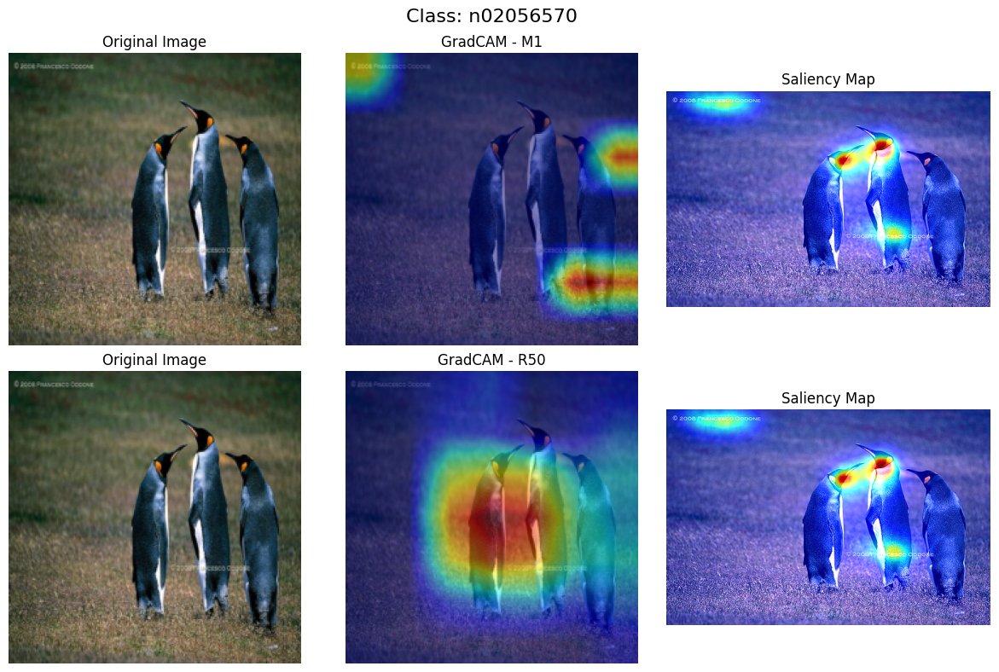

Media IoU M1 vs SUM: 0.3424
Media IoU ResNet50 vs SUM: 0.2270


In [20]:
import os
from torchvision import transforms
from PIL import Image
import torch.nn.functional as F
import torch

# Funzioni utili
def binarize_cam(cam, threshold=0.3):
    return (cam > threshold).float()

def iou(cam1, cam2):
    intersection = torch.logical_and(cam1.bool(), cam2.bool()).sum().float()
    union = torch.logical_or(cam1.bool(), cam2.bool()).sum().float()
    if union == 0:
        return 0.0
    return (intersection / union).item()

# Configura trasformazioni e path
saliency_path = '/content/saliency_maps'
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Crea dizionario con le saliency "_overlay"
saliency_dict = {}
for class_folder in os.listdir(saliency_path):
    class_path = os.path.join(saliency_path, class_folder)
    for fname in os.listdir(class_path):
        if "_overlay" in fname:
            base = fname.replace("_overlay.png", "")
            saliency_dict[base] = os.path.join(class_path, fname)

iousm1 = []
iousr50 = []

for batch_idx, (images, labels) in enumerate(val_loader):
    images = images.to(device)
    labels = labels.to(device)

    # CAMs per l'intero batch
    cams_m1 = generate_cam_batch(model_m1, cam_m1, images, device, target_labels=labels, use_pred=False)
    cams_r50 = generate_cam_batch(model_resnet50, cam_resnet50, images, device, target_labels=labels, use_pred=False)

    # Indici originali nel dataset completo
    batch_indices = val_dataset.indices[batch_idx * val_loader.batch_size : (batch_idx + 1) * val_loader.batch_size]

    for i in range(len(images)):
        idx = batch_indices[i]
        img_path = full_dataset.samples[idx][0]
        img_name = os.path.splitext(os.path.basename(img_path))[0]

        if img_name not in saliency_dict:
            continue

        # Load saliency map from SUM and process
        sal_img = Image.open(saliency_dict[img_name]).convert('L')
        sal_tensor = transform(sal_img).to(device).squeeze()
        sal_bin = binarize_cam(sal_tensor).to(device)

        cam1_resized = F.interpolate(cams_m1[i].unsqueeze(0), size=(224,224), mode='bilinear', align_corners=False).squeeze()
        cam2_resized = F.interpolate(cams_r50[i].unsqueeze(0), size=(224,224), mode='bilinear', align_corners=False).squeeze()

        cam1_bin = binarize_cam(cam1_resized).to(device)
        cam2_bin = binarize_cam(cam2_resized).to(device)

        iousm1.append(iou(cam1_bin, sal_bin))
        iousr50.append(iou(cam2_bin, sal_bin))

        if len(iousm1) <= 10:
            img = images[i]
            lbl = labels[i]
            class_name = full_dataset.classes[lbl.item()]
            sal_img1 = Image.open(saliency_dict[img_name])  # RGB o overlay

            show_gradcam_saliency(
                img_tensor=img,
                cam1=cam1_resized,
                cam2=cam2_resized,
                sal1=sal_img1,
                sal2=sal_img1,
                class_name=class_name
            )

# Media delle IoU su tutte le immagini elaborate
avg_iou_m1 = sum(iousm1) / len(iousm1)
avg_iou_r50 = sum(iousr50) / len(iousr50)

print(f"Media IoU M1 vs SUM: {avg_iou_m1:.4f}")
print(f"Media IoU ResNet50 vs SUM: {avg_iou_r50:.4f}")